**This notebook will be a comprehensive look into clinical data collected on patients who either have a high likelihood of stroke or have had a stroke. This will be the breakdown of exploration:**

1. EDA
2. Stroke Prediction

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

from sklearn.model_selection import train_test_split
#from imblearn.over_sampling import RandomOverSampler,SMOTE, ADASYN
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,auc,roc_auc_score,precision_score,recall_score

In [2]:
df = pd.read_csv("train_2v.csv")
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,30669,Male,3.0,0,0,No,children,Rural,95.12,18.0,NaN,0
1,30468,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
2,16523,Female,8.0,0,0,No,Private,Urban,110.89,17.6,NaN,0
3,56543,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
4,46136,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,NaN,0


Here is a breakdown of what each feature/variable means:

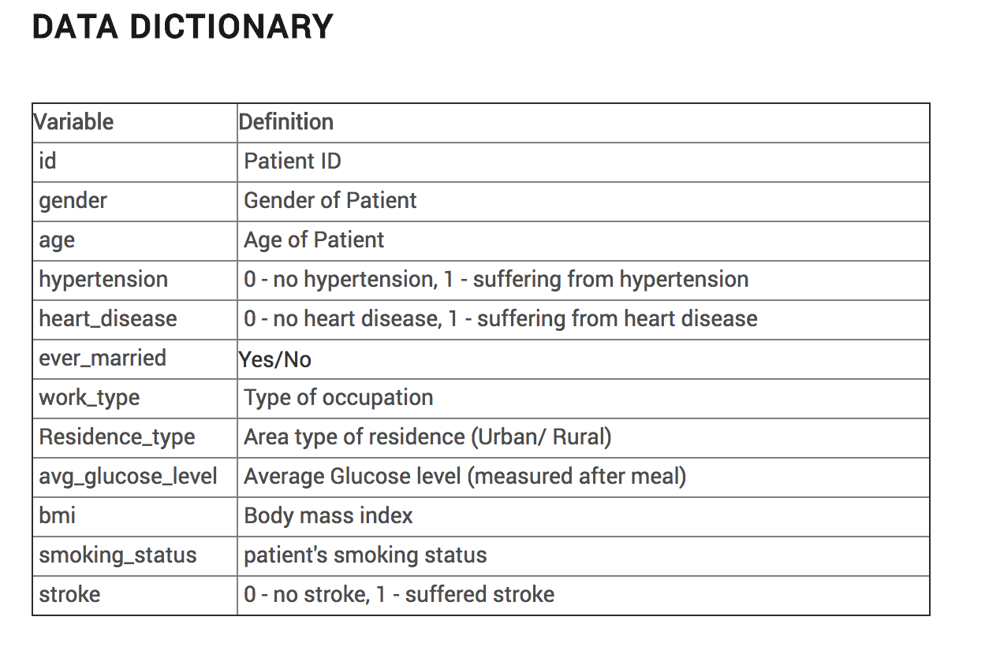

In [3]:
from IPython.display import Image
Image(filename = 'var_exp.png', width = 400, height = 400)

# EDA

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43400 entries, 0 to 43399
Data columns (total 12 columns):
id                   43400 non-null int64
gender               43400 non-null object
age                  43400 non-null float64
hypertension         43400 non-null int64
heart_disease        43400 non-null int64
ever_married         43400 non-null object
work_type            43400 non-null object
Residence_type       43400 non-null object
avg_glucose_level    43400 non-null float64
bmi                  41938 non-null float64
smoking_status       30108 non-null object
stroke               43400 non-null int64
dtypes: float64(3), int64(4), object(5)
memory usage: 4.0+ MB


There is a total of 43,400 rows with 12 columns.

In [5]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,43400.000000,43400.000000,43400.000000,43400.000000,43400.000000,41938.000000,43400.000000
mean,36326.142350,42.217894,0.093571,0.047512,104.482750,28.605038,0.018041
std,21072.134879,22.519649,0.291235,0.212733,43.111751,7.770020,0.133103
min,1.000000,0.080000,0.000000,0.000000,55.000000,10.100000,0.000000
25%,18038.500000,24.000000,0.000000,0.000000,77.540000,23.200000,0.000000
50%,36351.500000,44.000000,0.000000,0.000000,91.580000,27.700000,0.000000
75%,54514.250000,60.000000,0.000000,0.000000,112.070000,32.900000,0.000000
max,72943.000000,82.000000,1.000000,1.000000,291.050000,97.600000,1.000000


In [6]:
df.isnull().sum()

id                       0
gender                   0
age                      0
hypertension             0
heart_disease            0
ever_married             0
work_type                0
Residence_type           0
avg_glucose_level        0
bmi                   1462
smoking_status       13292
stroke                   0
dtype: int64

Most NULL's are in bmi and smoking_status.

In [7]:
temp_series = df['gender'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title='Gender Distribution'
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="gender_percentages")

Good thing we plotted because see that there is <1% "Other". Not all patients are classifed as M/F.

Let's see the distribution of age across all patients.

In [8]:
cnt_srs = df['age'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'agsunset',
        showscale=True
    ),
)
layout = go.Layout(
    title='Age Distribution',
    xaxis_title="Age",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="age_dist")

We can somewhat tell what most of the patients' ages are, but let's bin the ages in decades to determine where exactly do most patients fall on the age spectrum.

In [9]:
import plotly.express as px

fig = px.histogram(df, x="age", nbins=10)
fig.show()

Much better. Most patients are in the range between 45 years and 54 years old. 

The inital bin has negative number in its range. Let's take a look at the distribution of age with desciptive statistics output.

In [10]:
df.age.describe()

count    43400.000000
mean        42.217894
std         22.519649
min          0.080000
25%         24.000000
50%         44.000000
75%         60.000000
max         82.000000
Name: age, dtype: float64

In [11]:
len(df.loc[(df['age'] <= 0.08)])

17

17 rows of 0.08 age (1 month old). The range of patients' ages is huge - from 1 month old to 82 years old.

In [12]:
cnt_srs = df['hypertension'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'agsunset',
        showscale=True
    ),
)
layout = go.Layout(
    title='Hypertension Distribution',
    xaxis_title="Hypertension (0-No, 1-Yes)",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="hyp_dist")

Majority of patients do NOT have Hypertension.

In [13]:
cnt_srs = df['heart_disease'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'tealrose',
        showscale=True
    ),
)
layout = go.Layout(
    title='Heart Disease Distribution',
    xaxis_title="Heart Disease (0-No, 1-Yes)",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="heart_dist")

Most patients don't have heart disease.

In [14]:
cnt_srs = df['ever_married'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'blues',
        showscale=True
    ),
)
layout = go.Layout(
    title='Married Distribution',
    xaxis_title="Married",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="married_dist")

Majority of patient population is married. 

In [15]:
temp_series = df['work_type'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title='Work_Type Distribution'
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="work_percentages")

Most people work for the private industry. So somewhat fast-paced versus the slower goverment jobs.

In [16]:
cnt_srs = df['Residence_type'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'agsunset',
        showscale=True
    ),
)
layout = go.Layout(
    title='Residence Type Distribution',
    xaxis_title="Residence Type",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="res_dist")

This is pretty much a 50/50 split between patients that reside in the city and those that reside further away from the hustle and bustle of the city. 

In [17]:
fig = px.box(df, y="avg_glucose_level")
fig.show()

There is a huge skew towards the higher end. Outliers are many beyond the max.

In [18]:
df['bmi'].describe()

count    41938.000000
mean        28.605038
std          7.770020
min         10.100000
25%         23.200000
50%         27.700000
75%         32.900000
max         97.600000
Name: bmi, dtype: float64

In [19]:
fig = px.box(df, y="bmi")
fig.show()

Huge spread in upper end of bmi values.

In [20]:
cnt_srs = df['smoking_status'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'blues',
        showscale=True
    ),
)
layout = go.Layout(
    title='Smoking Status Distribution',
    xaxis_title="Smoking Status",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="smoke_dist")

Majority never smoked and those who formerly smoked about 1000 more than those who smoke.

Last. but not least, let us see the distribution of patients who have had a stroke.

In [21]:
cnt_srs = df['stroke'].value_counts()
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color = cnt_srs.values,
        colorscale= 'tealrose',
        showscale=True
    ),
)
layout = go.Layout(
    title='Stroke Distribution',
    xaxis_title="Stroke (0-No, 1-Yes)",
    yaxis_title="Count"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="stroke_dist")

Majority of patients have not had a stroke. This being our target value, there is definitely some class imbalance.

Now, let us look at some relationships between variables!

In [22]:
fig = px.box(df, x="ever_married", y="bmi", points="all")
fig.show()

Those who are married in general have a higher bmi either due to just being older with metabolism slowing down or they just put on the marriage weight.

In [23]:
fig = px.histogram(df, x="age", y="hypertension")
fig.show()

We can see here that those with highest amount of hypertension are very young (1-2), 50's and 70's.

In [24]:
fig = px.box(df, x="stroke", y="age", points="all")
fig.show()

Most of those who suffered from stroke are older, more concentrated in 60's and 70's.

In [25]:
fig = px.box(df, x="stroke", y="avg_glucose_level", points="all")
fig.show()

Those who suffered from stroke have higher levels of glucose in their bloodstream as well as vary across a wide range of values versus those who have not gone through stroke.

Now, let us look at these relationships numerically! Let's see which variables are closely tied to each other, especially the variables relationship with the target variable-stroke. Before doing so, we need to transform some non-numerical categories into numerical ones (gender, ever_married, work_type, Residence_type, smoking_status).

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43400 entries, 0 to 43399
Data columns (total 12 columns):
id                   43400 non-null int64
gender               43400 non-null object
age                  43400 non-null float64
hypertension         43400 non-null int64
heart_disease        43400 non-null int64
ever_married         43400 non-null object
work_type            43400 non-null object
Residence_type       43400 non-null object
avg_glucose_level    43400 non-null float64
bmi                  41938 non-null float64
smoking_status       30108 non-null object
stroke               43400 non-null int64
dtypes: float64(3), int64(4), object(5)
memory usage: 4.0+ MB


# Transforming Variables

First deal with the heavy NULL columns:
    
    Fill bmi NULL's column mean.

In [27]:
df["bmi"]=df["bmi"].fillna(df["bmi"].mean())

In [28]:
df.isnull().sum()

id                       0
gender                   0
age                      0
hypertension             0
heart_disease            0
ever_married             0
work_type                0
Residence_type           0
avg_glucose_level        0
bmi                      0
smoking_status       13292
stroke                   0
dtype: int64

Dropping smoking statusc column since missing 13292/43400 (30.6%) of data.

In [35]:
df = df.drop(['smoking_status'], axis = 1)

Now the rest of the categorical variables:

In [38]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,stroke
0,30669,Male,3.0,0,0,No,children,Rural,95.12,18.0,0
1,30468,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,0
2,16523,Female,8.0,0,0,No,Private,Urban,110.89,17.6,0
3,56543,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,0
4,46136,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,0


In [41]:
df['gender'] =df['gender'].astype('category').cat.codes
df['ever_married'] =df['ever_married'].astype('category').cat.codes
df['work_type'] =df['work_type'].astype('category').cat.codes
df['Residence_type'] =df['Residence_type'].astype('category').cat.codes

In [42]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,stroke
0,30669,1,3.0,0,0,0,4,0,95.12,18.0,0
1,30468,1,58.0,1,0,1,2,1,87.96,39.2,0
2,16523,0,8.0,0,0,0,2,1,110.89,17.6,0
3,56543,0,70.0,0,0,1,2,0,69.04,35.9,0
4,46136,1,14.0,0,0,0,1,0,161.28,19.1,0


Now, let's get that correlation matrix!

In [43]:
df.corr('pearson')

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,stroke
id,1.000000,0.001657,0.012760,0.006571,0.009234,0.010217,-0.010052,0.000120,0.024634,0.018382,0.002976
gender,0.001657,1.000000,-0.027903,0.023709,0.082061,-0.031351,0.063739,0.001508,0.035465,-0.021570,0.011198
age,0.012760,-0.027903,1.000000,0.272169,0.250188,0.693070,-0.366664,0.001299,0.237627,0.352236,0.156049
hypertension,0.006571,0.023709,0.272169,1.000000,0.119777,0.176575,-0.060800,-0.003124,0.160211,0.153779,0.075332
heart_disease,0.009234,0.082061,0.250188,0.119777,1.000000,0.128833,-0.021835,-0.002743,0.146938,0.054133,0.113763
ever_married,0.010217,-0.031351,0.693070,0.176575,0.128833,1.000000,-0.359848,0.004422,0.153607,0.337517,0.071920
work_type,-0.010052,0.063739,-0.366664,-0.060800,-0.021835,-0.359848,1.000000,-0.003473,-0.059303,-0.318601,-0.010800
Residence_type,0.000120,0.001508,0.001299,-0.003124,-0.002743,0.004422,-0.003473,1.000000,0.000014,-0.003685,0.002247
avg_glucose_level,0.024634,0.035465,0.237627,0.160211,0.146938,0.153607,-0.059303,0.000014,1.000000,0.184199,0.078917
bmi,0.018382,-0.021570,0.352236,0.153779,0.054133,0.337517,-0.318601,-0.003685,0.184199,1.000000,0.018407


We can see here that age has high correlation with ever_married, hypertension, avg_glucose_level, bmi and stroke. Let's see if being married, having high blood pressure, high sugar levels in diet and being heavier are large contributors to stroke after running classification algorithm.

# Note on Imbalanced Data 
(Imbalanced data usually leads to most represented class being classified leading to misclassifications)

In [46]:
df.stroke.value_counts()

0    42617
1      783
Name: stroke, dtype: int64

Without stroke class is represented approximately 6x more than stroke class.

Though this is the case, tree classifiers are immune to this since their hierarchical structure allows them to learn signals from both classes. In modern ML, tree ensembles outperform basic Decision Tree. So we'll proceed with Random Forest algorithm. We will also specify that classes are imbalanced in parameters section of RandomForestClassifier.

# Making Training and Test Sets

In [47]:
X = df.drop(['stroke'], axis = 1)
y = df['stroke']

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X ,y, test_size=0.2)

# Tree Based Models

Tree based learning algorithms are considered to be one of the best and mostly used supervised learning methods. Tree based methods empower predictive models with high accuracy, stability and ease of interpretation. Unlike linear models, they map non-linear relationships quite well. They are adaptable at solving any kind of problem at hand (classification or regression). Methods like decision trees, random forest, gradient boosting are being popularly used in all kinds of data science problems.

# Random Forest 

Random Forest is a versatile machine learning method capable of performing both regression and classification tasks. It also undertakes dimensional reduction methods, treats missing values, outlier values and other essential steps of data exploration, and does a fairly good job. It is a type of ensemble learning method, where a group of weak models combine to form a powerful model.

In Random Forest, we grow multiple trees as opposed to a single tree in Classification and Regression Tree (CART) model. To classify a new object based on attributes, each tree gives a classification and we say the tree “votes” for that class. The forest chooses the classification having the most votes (over all the trees in the forest) and in case of regression, it takes the average of outputs by different trees.

In [58]:
from sklearn.ensemble import RandomForestClassifier

ran = RandomForestClassifier(class_weight="balanced", n_estimators=50, random_state=0)
ran.fit(X_train,y_train)

pred = ran.predict(X_test)
print(classification_report(y_test,pred))

print ("Accuracy Score:", accuracy_score(y_test,pred))

print ("Confusion Matrix:",'\n', confusion_matrix(y_test,pred))

precision = precision_score(y_test,pred)
recall = recall_score(y_test,pred)
print( 'precision = ', precision, '\n', 'recall = ', recall)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      8517
           1       0.00      0.00      0.00       163

    accuracy                           0.98      8680
   macro avg       0.49      0.50      0.50      8680
weighted avg       0.96      0.98      0.97      8680

Accuracy Score: 0.9812211981566821
Confusion Matrix: 
 [[8517    0]
 [ 163    0]]
precision =  0.0 
 recall =  0.0


C:\Users\mindy\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\mindy\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Model performance report:
    
    Precision is how many of the predictions are actually true. For no stroke predictions, 98% were actually patients that did not go through a stroke. However, for those who had a stroke, no predictions were made. So 0% there. 
    
    Recall is the proportion of true positives. Model correctly identified 100% of class 0/no stroke and 0% or class 1/stroke.
    
    Accuracy is only high because it classified most of the data correctly. And most of the data had 0 as class. This does not help much if the point of the model is to predict stroke given patient data.
   
    Confusion matrix shows on the diagonal the predicted classes and on the horizontal the actual classes. Thus, 8517 of actual no stroke cases were predicted as no stroke. However, 163 cases of stroke cases were predicted as not having a stroke. So that is where the model has failed.
    
    Different outcome can come into play when model is used to predict on test data from separate csv file, not original train data.

**ROC and AUC**

A receiver operating characteristic curve, i.e. ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system.

ROC curve is defined as: { Sensitivity(r),1−Specificity(r);r∈[0,1] }

The area under the ROC is denoted by AUC and is one of the main criteria for assessing discrimination accuracy. It is equal to the probability that a classifier will rank a randomly chosen positive instance higher than a randomly chosen negative one (assuming 'positive' ranks higher than 'negative').

The closer the curve follows the upper left-hand corner and the larger the area under the curve, the better the test is at discriminating between those with and without the disease.

The interpretation of the AUC curves:

    AUC	| Diagnostic accuracy

    0.9-1.0	| Excellent
    0.8-0.9	| Very good
    0.7-0.8	| Good
    0.6-0.7	| Sufficient
    0.5-0.6	| Bad
    <0.5	| Test not useful

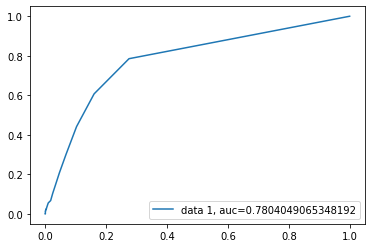

In [65]:
y_pred_proba = ran.predict_proba(X_test)[::,1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

We can see here that despite the poor performance metrics from classification report and confusion matrix, the ROC curve shows that the diagnostic accuracy is stil good. This is in line with the accuracy score though and its reason for being high.

In [67]:
impFeatures = pd.DataFrame((ran.feature_importances_) ,index=df.loc[:,df.columns!='stroke'].columns,columns=['Importance']).sort_values(by='Importance',ascending=False)
print (impFeatures)

                   Importance
age                  0.361530
avg_glucose_level    0.168999
bmi                  0.153239
id                   0.145768
work_type            0.050688
ever_married         0.035822
heart_disease        0.029325
hypertension         0.020136
Residence_type       0.017775
gender               0.016720


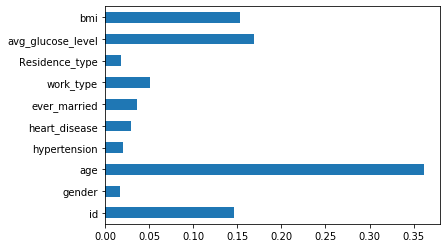

In [68]:
feat_importances = pd.Series(ran.feature_importances_, index=df.loc[:,df.columns!='stroke'].columns)
feat_importances.plot(kind='barh')

According to this output, age > avg_gluose_level > bmi have the highest correlation with stroke.

Now let us see how good the model is at predicting on the test data.

In [61]:
df2 = pd.read_csv('test_2v.csv')
df2.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status
0,36306,Male,80.0,0,0,Yes,Private,Urban,83.84,21.1,formerly smoked
1,61829,Female,74.0,0,1,Yes,Self-employed,Rural,179.50,26.0,formerly smoked
2,14152,Female,14.0,0,0,No,children,Rural,95.16,21.2,NaN
3,12997,Male,28.0,0,0,No,Private,Urban,94.76,23.4,NaN
4,40801,Female,63.0,0,0,Yes,Govt_job,Rural,83.57,27.6,never smoked


Impute NaN's, drop smoke column and transform categorical columns into numeric.

In [63]:
df2["bmi"]=df2["bmi"].fillna(df2["bmi"].mean())
df2 = df2.drop(['smoking_status'], axis = 1)
df2['gender'] =df2['gender'].astype('category').cat.codes
df2['ever_married'] =df2['ever_married'].astype('category').cat.codes
df2['work_type'] =df2['work_type'].astype('category').cat.codes
df2['Residence_type'] =df2['Residence_type'].astype('category').cat.codes

In [64]:
pred = ran.predict(df2)
prediction = pd.DataFrame(pred,columns=['Pred'])
prediction['Pred'].value_counts()

0    18599
1        2
Name: Pred, dtype: int64

Model predicted **2 strokes** from test data. This proves that model still could predict stroke even if intial assessment of model was poor based on original test data from original dataset.